## Workshop - Instrumnets for detecting fake news

### Plan

1. Twitter Dataset gathering

2. Analyze fake news dataset 

3. Introduce approaches for text vectorization and Apply classification techinques on vectorized text

4. Train End2End Transformer model using huggingface

5. Aplly topic modelling approaches 

## 1. Twitter Dataset gathering 

Twitter developer [dashboard](https://developer.twitter.com/en/portal/dashboard)

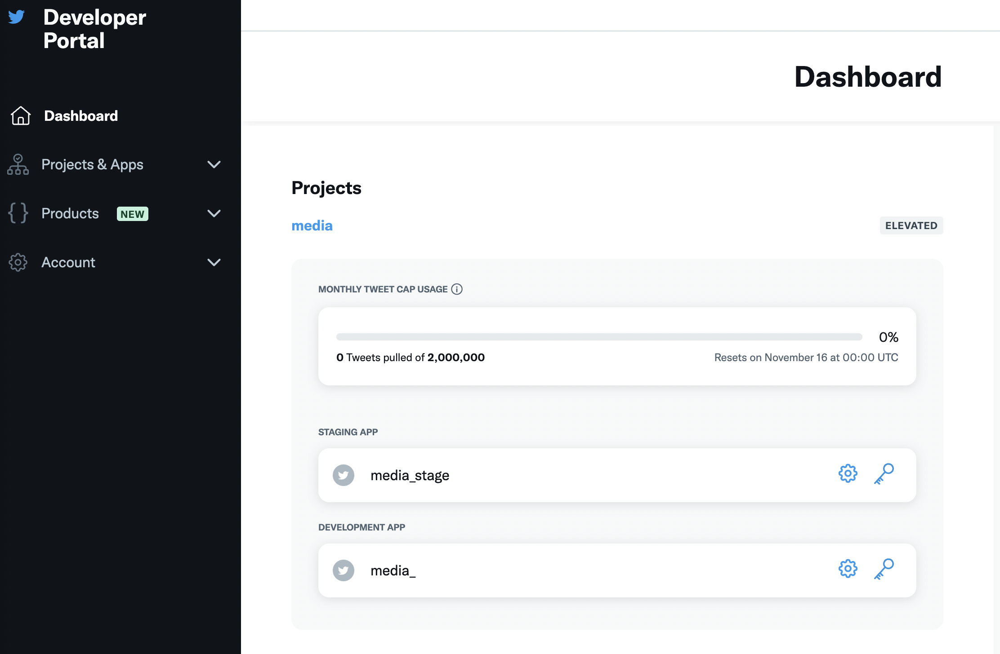

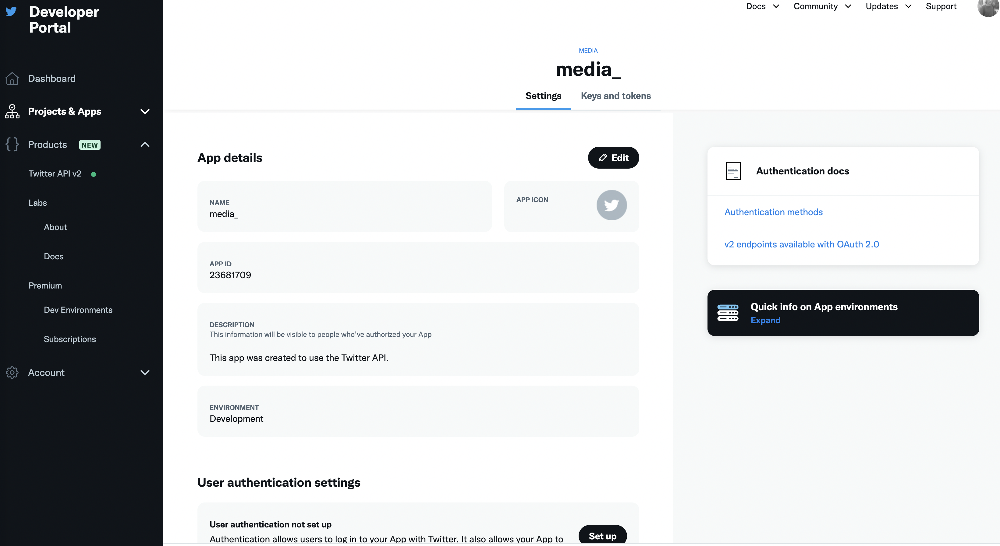

In [1]:
import os
# os.environ["CUDA_VISIBLE_DEVICES"]="0"
os.environ["TOKENIZERS_PARALLELISM"]="true"

import requests
import os
import json
from datetime import datetime
import rfc3339 
import iso8601   
import pandas as pd
import time

In [2]:
bearer_token = "AAAAAAAAAAAAAAAAAAAAAK1aaQEAAAAA3NG9m03A1eZTLOGPhDoyudMu4F8%3Dm441yoYSuqq5YRVDArXcQRum0CCJbZDFcX7GfbDN57P66ovZis"

def create_url(user_id):
    #user_id = 22390494
    return "https://api.twitter.com/2/users/{}/tweets".format(user_id)

def get_params():
    return {"tweet.fields": "created_at", "max_results":100,
            "start_time":rfc3339.rfc3339(iso8601.parse_date(d+'T00:00:00')),
           "end_time":rfc3339.rfc3339(iso8601.parse_date(d+'T23:59:59'))
           }

def bearer_oauth(r):
    """
    Method required by bearer token authentication.
    """

    r.headers["Authorization"] = f"Bearer {bearer_token}"
    r.headers["User-Agent"] = "v2UserTweetsPython"
    return r

def connect_to_endpoint(url, params):
    response = requests.request("GET", url, auth=bearer_oauth, params=params)
    print(response.status_code)
    if response.status_code != 200:
        raise Exception(
            "Request returned an error: {} {}".format(
                response.status_code, response.text
            )
        )
    return response.json()


In [3]:
id_list = [2097571,
           807095,
           2467791,
           742143,
           6107422,
           788524,
           16449615,
           2834511,
           1081459807,
           9300262,
           18047862,
           19179390,
           25049056,
           3108351]
name_list = ["cnn",
             "nyt",
             "wp",
             "bbc",
             "ft",
    "dailymail",
             "dw",
             "spigel",
             "zeit",
             "politico",
             "faz",
             "gw",
             "f24",
             "WSJ"]

d = "2022-11-11"
twitter_df = pd.DataFrame() 
print(d)
for i in range(0,len(id_list)):
    try:
        url = create_url(id_list[i])
        params = get_params()
        json_response = connect_to_endpoint(url, params)
        print(name_list[i])
        df = pd.DataFrame(json_response['data'])
        df["media"] = name_list[i]
        if twitter_df.empty:
            twitter_df = df
        else:
            twitter_df.append(df, ignore_index=True)
    except KeyError:
        print(name_list[i])
        print("error")

2022-11-11
200
cnn
200
nyt
nyt
error
200
wp
wp
error
200
bbc


/tmp/ipykernel_3485163/2053606526.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twitter_df.append(df, ignore_index=True)


200
ft
ft
error
200
dailymail
dailymail
error
200
dw
200
spigel
spigel
error


/tmp/ipykernel_3485163/2053606526.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twitter_df.append(df, ignore_index=True)


200
zeit


/tmp/ipykernel_3485163/2053606526.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twitter_df.append(df, ignore_index=True)


200
politico
200
faz
faz
error


/tmp/ipykernel_3485163/2053606526.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twitter_df.append(df, ignore_index=True)


200
gw


/tmp/ipykernel_3485163/2053606526.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twitter_df.append(df, ignore_index=True)


200
f24
200
WSJ
WSJ
error


/tmp/ipykernel_3485163/2053606526.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twitter_df.append(df, ignore_index=True)


In [4]:
print(twitter_df.head())

                                                text edit_history_tweet_ids  \
0  One of the bonuses of being the British monarc...  [1591215478684684289]   
1  The comments come amid nationwide protests tha...  [1591200512329732096]   
2  A university in Uganda has withdrawn a require...  [1591195150948212749]   
3  UK's flagship carrier is the latest airline to...  [1591189978838704164]   
4  The strike occurred northeast of Mogadishu at ...  [1591184894050410514]   

                    id                created_at media  
0  1591215478684684289  2022-11-11T23:45:08.000Z   cnn  
1  1591200512329732096  2022-11-11T22:45:39.000Z   cnn  
2  1591195150948212749  2022-11-11T22:24:21.000Z   cnn  
3  1591189978838704164  2022-11-11T22:03:48.000Z   cnn  
4  1591184894050410514  2022-11-11T21:43:36.000Z   cnn  


## 2. Analyze fake news dataset 



First of all, we need to determine differences between two task formulations in fake news and propaganda analyses:

- Fact checking - techniques, which check whether proposed information is true or not 
- Presence of manipulations - techniques, which check whether proposed information contain specieal techniques, which are aimed at controlling readers' opinion to writers' advantage

`Presence of manipulations` may use also not real information or not fully true information

In our workshop we will work with manipulation techniques

Our dataset is a Ukranian-russian analogue of [Fine-Grained Analysis of Propaganda in News Articles](https://propaganda.qcri.org/papers/EMNLP_2019__Fine_Grained_Propaganda_Detection.pdf). Originally dataset is labeled in [NER style](https://en.wikipedia.org/wiki/Named-entity_recognition). So each token (word) is labeled with one of manipulation techinques or absence of manipulation:

1. Loaded language
2. Name calling or labeling
3. Repetition
4. Exaggeration or minimization
5. Doubt
6. Appeal to fear/prejudice
7. Flag-waving
8. Causal oversimplification
9. Slogans
10. Appeal to authority
11. Black-and-white fallacy, dictatorship
12. Thought-terminating cliche
13. Whataboutism
14. Reductio ad Hitlerum
15. Red herring
16. Bandwagon
17. Obfuscation, intentional vagueness, confu-
sion
18. Straw man


Examples of originaly labeled samples

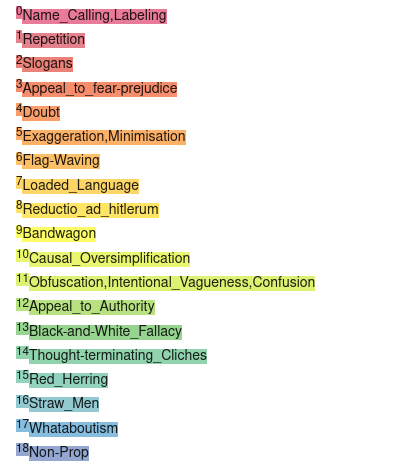

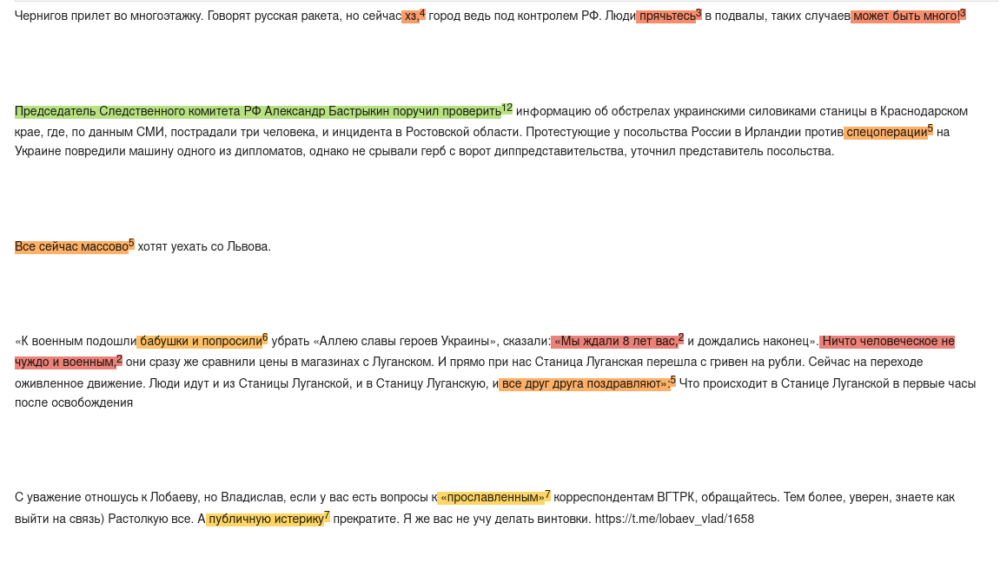

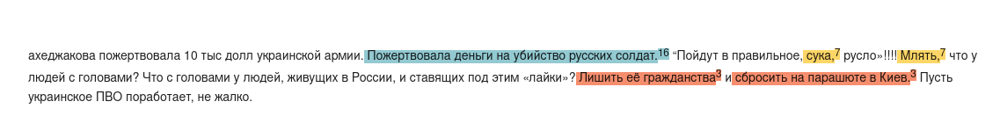

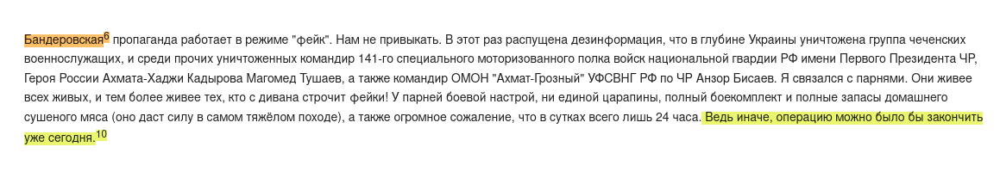

In order to simplify task and trasnform it into news classification task we will use next rule for creating news label - `any propaganda word in news`

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from pprint import pprint

In [6]:
train_df  = pd.read_csv("../data/propaganda_detection_our_data/fake_detection_df_train.csv")
test_df  = pd.read_csv("../data/propaganda_detection_our_data/fake_detection_df_test.csv")
val_df  = pd.read_csv("../data/propaganda_detection_our_data/fake_detection_df_val.csv")

In [7]:
train_df.head()

,id,text,label
0,00000_03514,Чернигов прилет во многоэтажку. Говорят русска...,True
1,00002_06059,Председатель Следственного комитета РФ Алексан...,True
2,00003_08645,Все сейчас массово хотят уехать со Львова.,True
3,00004_00901,«К военным подошли бабушки и попросили убрать ...,True
4,00006_06251,"С уважение отношусь к Лобаеву, но Владислав, е...",True


In [8]:
print("News with manipulations:\n")
for news in train_df[train_df["label"]].sample(5).text:
    print(news)
    print("================")

print("\nNews without manipulations:\n")
for news in train_df[~train_df["label"]].sample(5).text:
    print(news)
    print("================")

News with manipulations:

❗️ Байден: Россия заплатит высокую цену за спецоперацию на Украине "в краткосрочной и особенно долгосрочной" перспективе. ‼️ Байден: альтернативой масштабным санкциям против России было бы «Начало Третьей мировой войны.
Если ребята продержатся до светла, при поддержке нашей авиации "выкурить" их оттуда будет уже невозможно https://t.me/mig41/13381
❗️ Аргентина и Бразилия не стали подписывать заявление входящих в Организацию американских государств стран, осудивших российскую военную операцию на Украине Страны считают, что конфликт не находится в компетенции организации.
⚡️ Российская делегация прибыла в Белоруссию на переговоры с украинцами, готова начать их в Гомеле, сообщил Песков
Поддерживаем опричников .

News without manipulations:

В районе Сум в плен попал один из наших. Какой-то грузовик одной из тыловых колонн тормознули. Администрация Сум утверждает, что в городе идут бои. Так что возможно это кто-то из колонны проходившей через Сумы в направлении Ко

As you may notice even from random samples. Text contains lots of special symbols, which we should clean before applying ML algorithmes 

In [9]:
import nltk
import re

from nltk import tokenize
nltk.download('punkt')

def collapse_dots(input):
    # Collapse sequential dots
    input = re.sub("\.+", ".", input)
    # Collapse dots separated by whitespaces
    all_collapsed = False
    while not all_collapsed:
        output = re.sub(r"\.(( )*)\.", ".", input)
        all_collapsed = input == output
        input = output
    return output

# TODO: Try to get rid of some preporcessing or add something
# Check how it will influence different ML models
def process_text(input):
    if isinstance(input, str):
        input = " ".join(tokenize.sent_tokenize(input))
        input = re.sub(r"http\S+", "", input)
        input = re.sub(r"\n+", ". ", input)
        for symb in ["!", ",", ":", ";", "?"]:
            input = re.sub(rf"\{symb}\.", symb, input)
        input = re.sub("[^а-яА-Яa-zA-Z0-9!\"#$%&'()*+,-./:;<=>?@[\\]^_`{|}~ё]+", " ", input)
        input = re.sub(r"#\S+", "", input)
        input = collapse_dots(input)
        input = input.strip()
        # input = input.lower()
    return input

[nltk_data] Downloading package punkt to /home/vova/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [10]:
train_df["processed_text"] = train_df["text"].apply(process_text)
test_df["processed_text"] = test_df["text"].apply(process_text)
val_df["processed_text"] = val_df["text"].apply(process_text)

In [11]:
print("News with manipulations:\n")
sampled_ids = np.random.choice(train_df[train_df["label"]].index, size=5)
for id in sampled_ids:
    print("Before preprocessing:\n")
    print(train_df.loc[id, "text"])
    print("After preprocessing:\n")
    print(train_df.loc[id, "processed_text"])
    print("================")

print("\nNews without manipulations:\n")
sampled_ids = np.random.choice(train_df[~train_df["label"]].index, size=5)
for id in sampled_ids:
    print("Before preprocessing:\n")
    print(train_df.loc[id, "text"])
    print("After preprocessing:\n")
    print(train_df.loc[id, "processed_text"])
    print("================")

News with manipulations:

Before preprocessing:

ВСУ разместили артиллерию на школьном дворе в Северодонецке
After preprocessing:

ВСУ разместили артиллерию на школьном дворе в Северодонецке
Before preprocessing:

Администрация социальной сети Facebook наложила ограничения на официальную страницу медиахолдинга РБК. С момента начала российской военной операции на Украине несколько постов РБК в Facebook были помечены экспертами по проверке фактов как «содержащие ложную информацию». Это были сообщения на основе заявлений официальных лиц России, ЛНР и ДНР. После этого Facebook наложила ограничения на страницу РБК, в частности ограничила монетизацию, пессимизировала в выдаче и лишила статуса источника новостей. «Достоверность информации не определяется гражданством тех, кто выступает источником новостей, я считаю решение администрации социальной сети лишенным оснований», — сказал глава Объединенной редакции РБК Петр Канаев. При освещении военного конфликта мы в рамках законодательства Росси

Next we can extract some meta information about our texts. For example:

- number of symbols
- number of words
- number of sentences 

In [12]:
train_df["n_symbols"] = train_df["processed_text"].apply(len)
test_df["n_symbols"] = test_df["processed_text"].apply(len)
val_df["n_symbols"] = val_df["processed_text"].apply(len)

train_df["n_words"] = train_df["processed_text"].apply(lambda x: len(nltk.tokenize.word_tokenize(x)))
test_df["n_words"] = test_df["processed_text"].apply(lambda x: len(nltk.tokenize.word_tokenize(x)))
val_df["n_words"] = val_df["processed_text"].apply(lambda x: len(nltk.tokenize.word_tokenize(x)))

train_df["n_sents"] = train_df["processed_text"].apply(lambda x: len(nltk.tokenize.sent_tokenize(x)))
test_df["n_sents"] = test_df["processed_text"].apply(lambda x: len(nltk.tokenize.sent_tokenize(x)))
val_df["n_sents"] = val_df["processed_text"].apply(lambda x: len(nltk.tokenize.sent_tokenize(x)))

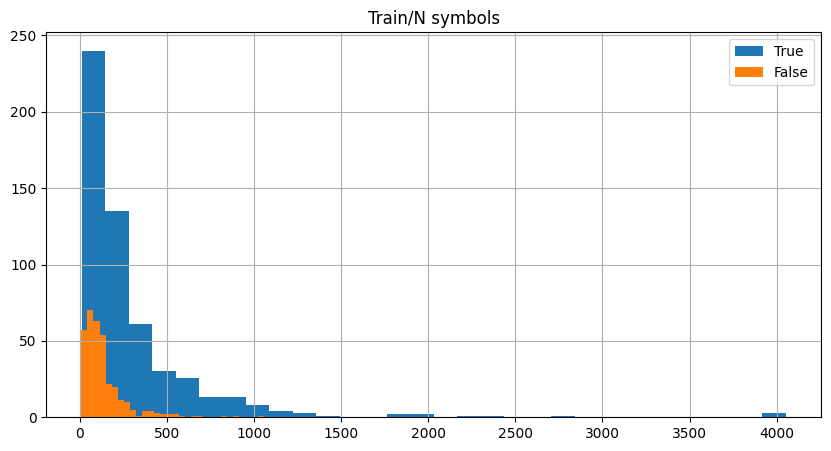

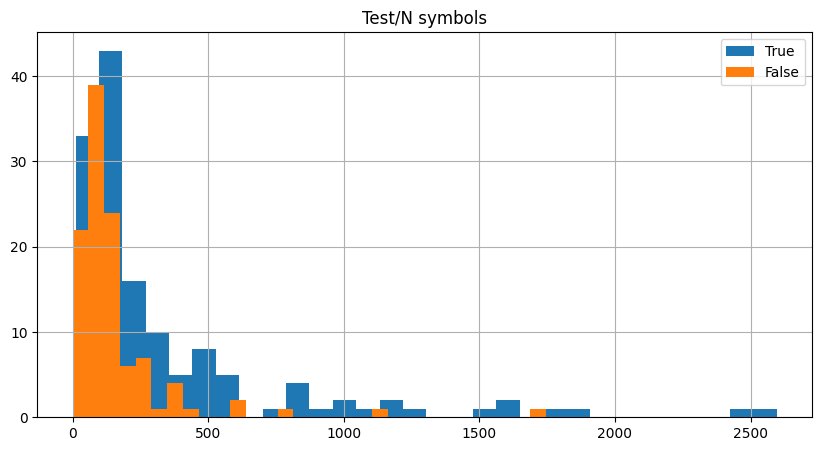

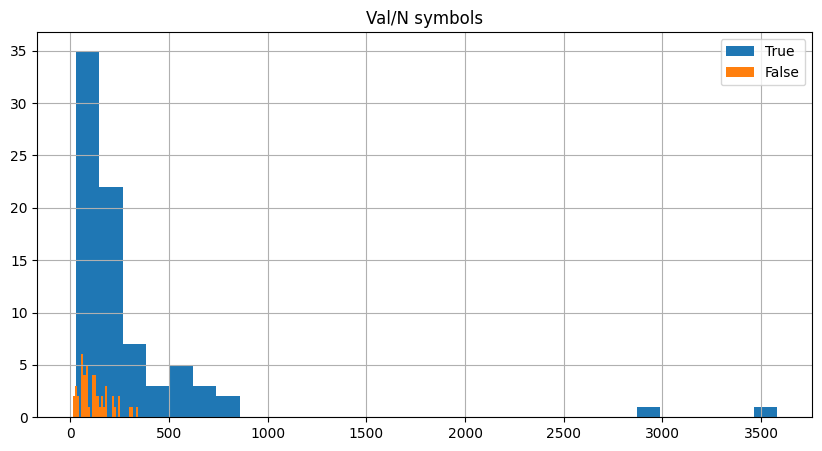

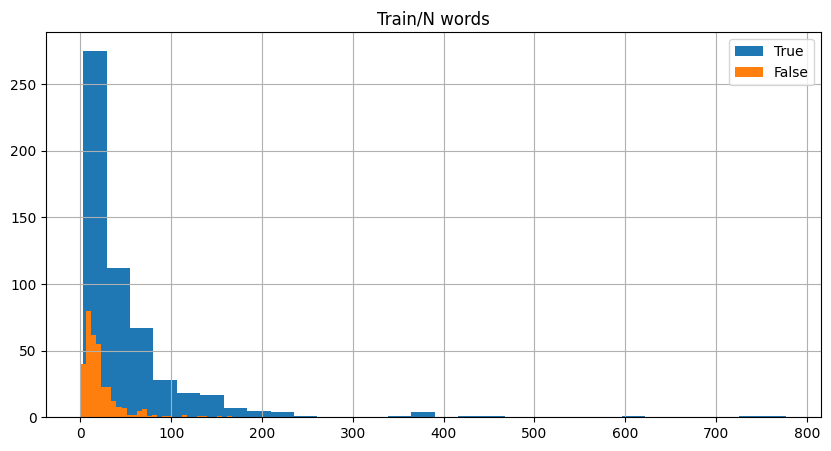

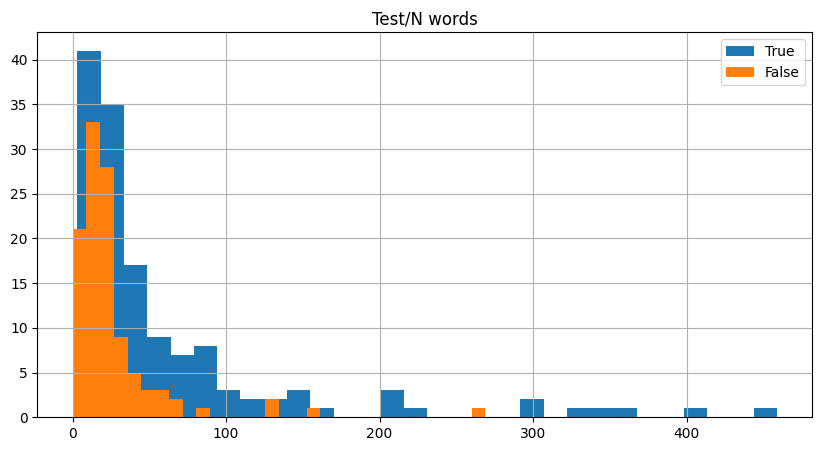

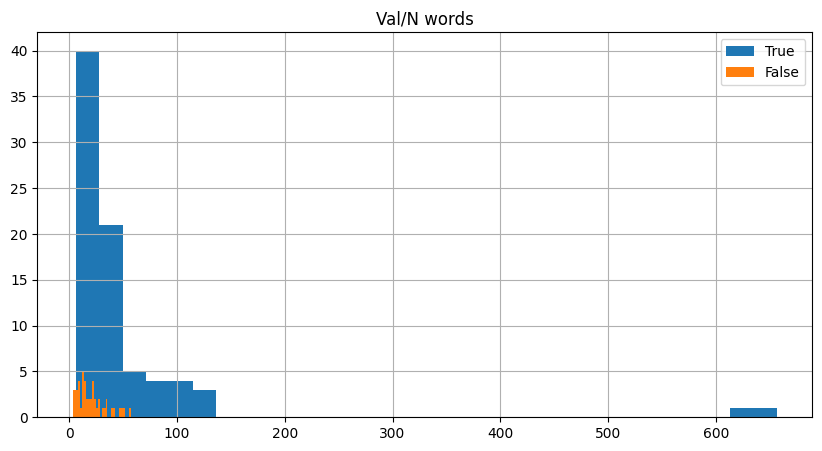

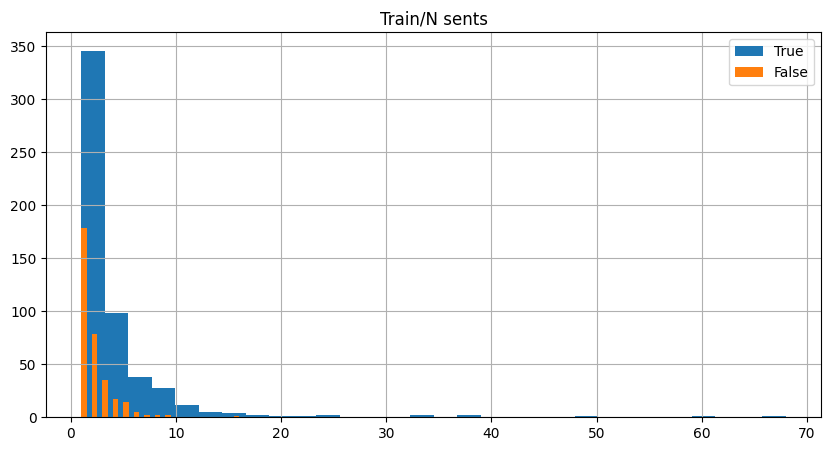

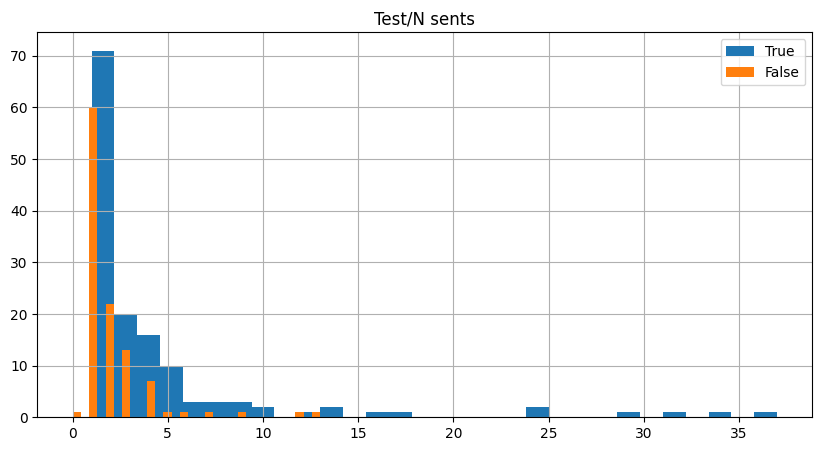

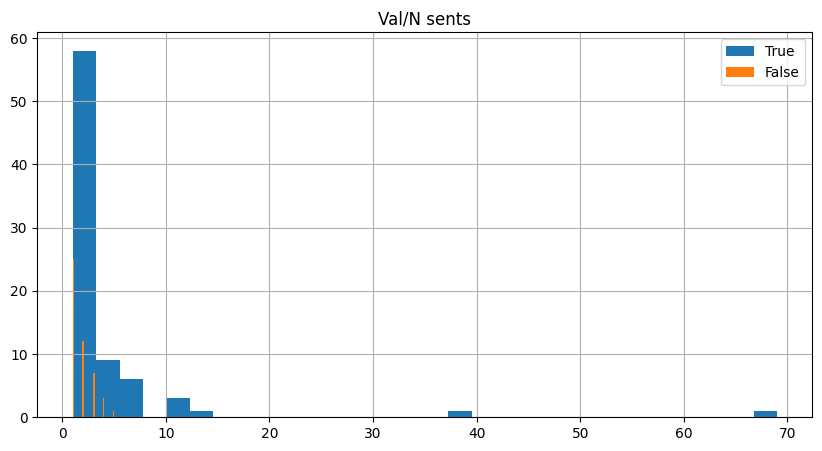

In [13]:
plt.figure(figsize=(10,5))
plt.title("Train/N symbols")
train_df.loc[train_df["label"], "n_symbols"].hist(bins=30, label="True")
train_df.loc[~train_df["label"], "n_symbols"].hist(bins=30, label="False")
plt.legend()
plt.show()
plt.figure(figsize=(10,5))
plt.title("Test/N symbols")
test_df.loc[test_df["label"], "n_symbols"].hist(bins=30, label="True")
test_df.loc[~test_df["label"], "n_symbols"].hist(bins=30, label="False")
plt.legend()
plt.show()
plt.figure(figsize=(10,5))
plt.title("Val/N symbols")
val_df.loc[val_df["label"], "n_symbols"].hist(bins=30, label="True")
val_df.loc[~val_df["label"], "n_symbols"].hist(bins=30, label="False")
plt.legend()
plt.show()

plt.figure(figsize=(10,5))
plt.title("Train/N words")
train_df.loc[train_df["label"], "n_words"].hist(bins=30, label="True")
train_df.loc[~train_df["label"], "n_words"].hist(bins=30, label="False")
plt.legend()
plt.show()
plt.figure(figsize=(10,5))
plt.title("Test/N words")
test_df.loc[test_df["label"], "n_words"].hist(bins=30, label="True")
test_df.loc[~test_df["label"], "n_words"].hist(bins=30, label="False")
plt.legend()
plt.show()
plt.figure(figsize=(10,5))
plt.title("Val/N words")
val_df.loc[val_df["label"], "n_words"].hist(bins=30, label="True")
val_df.loc[~val_df["label"], "n_words"].hist(bins=30, label="False")
plt.legend()
plt.show()

plt.figure(figsize=(10,5))
plt.title("Train/N sents")
train_df.loc[train_df["label"], "n_sents"].hist(bins=30, label="True")
train_df.loc[~train_df["label"], "n_sents"].hist(bins=30, label="False")
plt.legend()
plt.show()
plt.figure(figsize=(10,5))
plt.title("Test/N sents")
test_df.loc[test_df["label"], "n_sents"].hist(bins=30, label="True")
test_df.loc[~test_df["label"], "n_sents"].hist(bins=30, label="False")
plt.legend()
plt.show()
plt.figure(figsize=(10,5))
plt.title("Val/N sents")
val_df.loc[val_df["label"], "n_sents"].hist(bins=30, label="True")
val_df.loc[~val_df["label"], "n_sents"].hist(bins=30, label="False")
plt.legend()
plt.show()

And, of course, fancy word count for each class

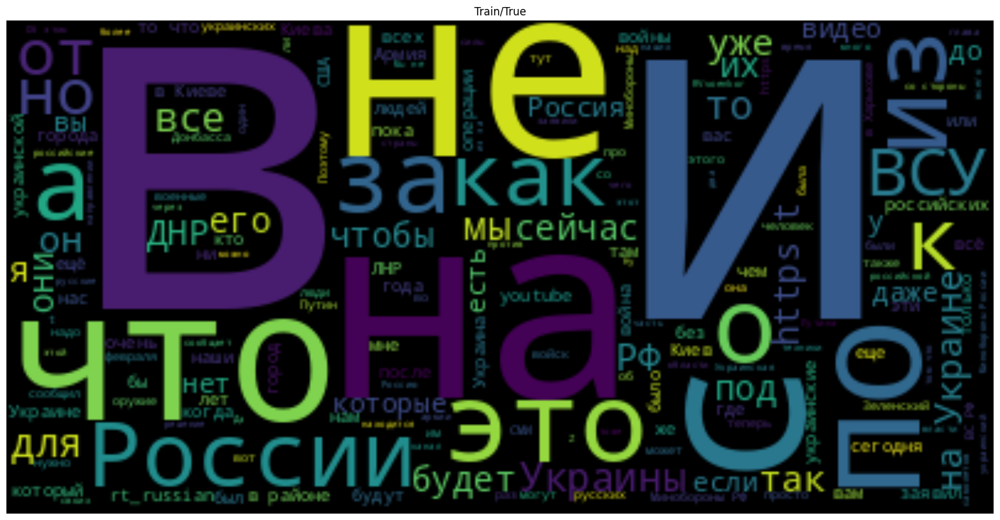

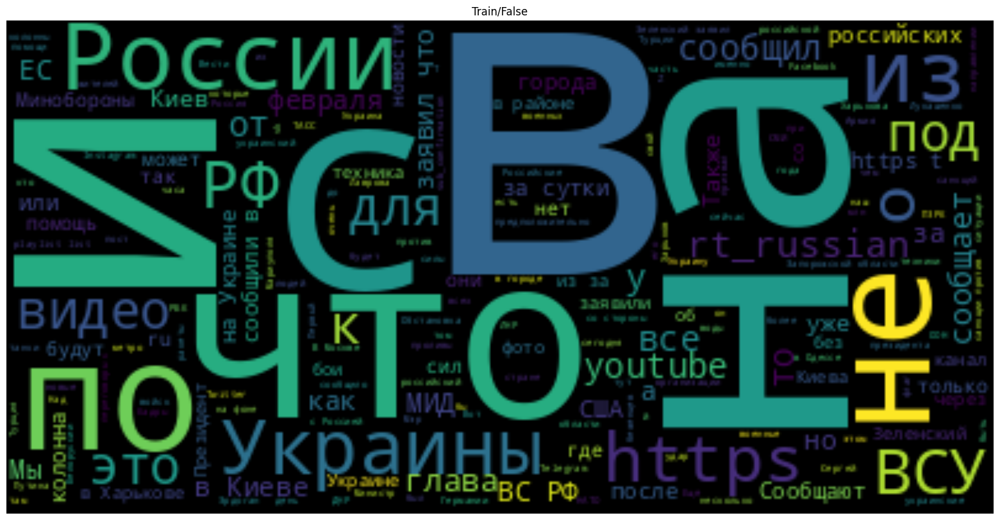

In [14]:
from wordcloud import WordCloud

wordcloud = WordCloud().generate(
    ". ".join(train_df.loc[train_df["label"], "text"].to_list())
  )
plt.figure(figsize=(20,10))
plt.title("Train/True")
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

wordcloud = WordCloud().generate(
    ". ".join(train_df.loc[~train_df["label"], "text"].to_list())
  )
plt.figure(figsize=(20,10))
plt.title("Train/False")
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

We can clearly see that `stopwords` completely collapse our WordCloud. Lets try to filter them 

In [15]:
nltk.download("stopwords")

from nltk.corpus import stopwords

russian_stopwords = stopwords.words("russian")

[nltk_data] Downloading package stopwords to /home/vova/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


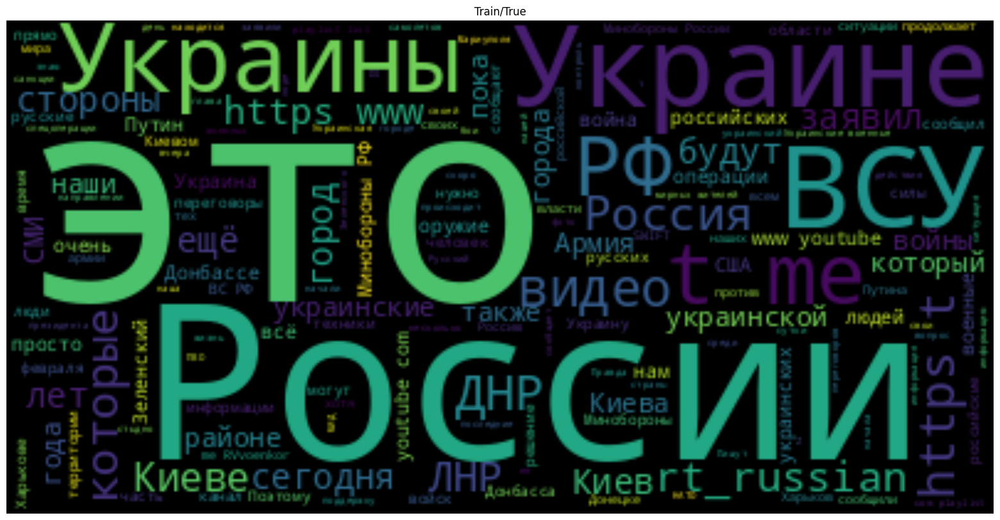

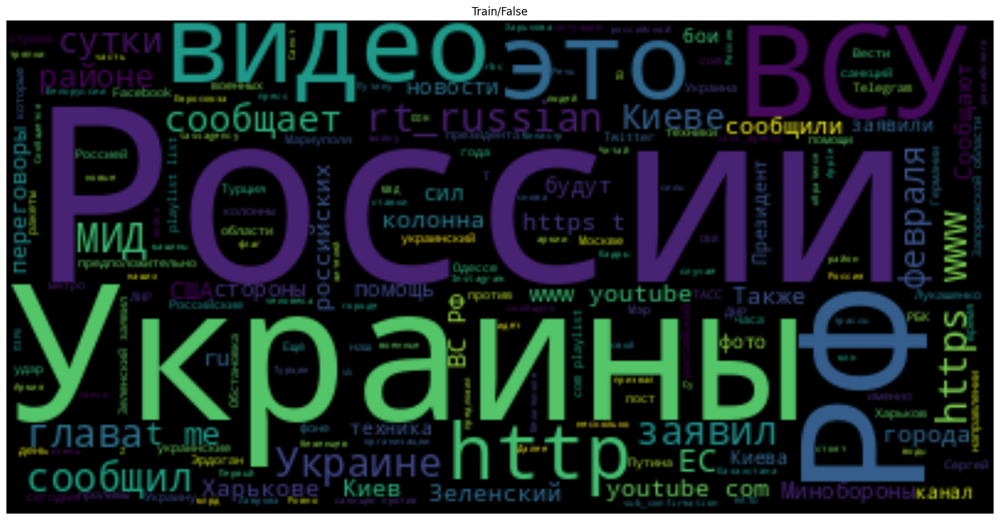

In [16]:
wordcloud = WordCloud(stopwords=russian_stopwords).generate(
    ". ".join(train_df.loc[train_df["label"], "text"].to_list()),
  )
plt.figure(figsize=(20,10))
plt.title("Train/True")
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

wordcloud = WordCloud(stopwords=russian_stopwords).generate(
    ". ".join(train_df.loc[~train_df["label"], "text"].to_list()),
  )
plt.figure(figsize=(20,10))
plt.title("Train/False")
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

## 3. Introduce approaches for text vectorization and Apply classification techinques on vectorized text


Small reminder about model evaluation:

We will fit on train and validate on test and val. Also we will report train metrics too to track overfitting 

We will use next metrics:
- [Roc Auc](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html) - basic choice for detection task. Evaluate model ranking quality 
AUC.svg
- [Accuracy](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html) - also good choice for classification task but may not good in case of imbalanced dataset
- [Confusion matrix](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html) - allow to track different types of model errors in comfortable table view
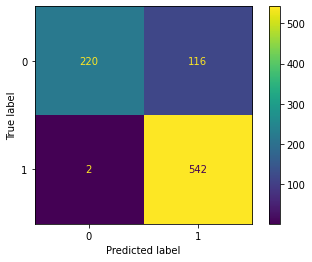
- Show top TP, FP, FN, TN samples

In [17]:
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay

def get_pos_neg_texts_probs(
    texts,
    probs,
    reals,
    is_pos=True
):
    if is_pos:
        selected_ids = np.where(reals > 0.5)[0]
    else:
        selected_ids = np.where(reals < 0.5)[0]

    return texts[selected_ids], probs[selected_ids]

def classification_report(
    train_probs,
    train_real,
    train_texts,
    test_probs,
    test_real,
    test_texts,
    val_probs,
    val_real,
    val_texts,
    tresh=0.5,
    sent_to_show=None
):
    train_texts = np.array(train_texts)
    test_texts = np.array(test_texts)
    val_texts = np.array(val_texts)

    for real, prob, name, text in zip(
        [train_real, test_real, val_real],
        [train_probs, test_probs, val_probs],
        ["train", "test", "val"],
        [train_texts, test_texts, val_texts]
    ):
        print(
            f"{name} Roc Auc: {roc_auc_score(real, prob)}"
        )
        print(
            f"{name} Accuracy : {accuracy_score(real, prob > tresh)}"
        )
        plt.figure(figsize=(10,5))
        plt.title(f"{name} Real vs Pred distribution")
        plt.hist(real, bins=30, label="Real")
        plt.hist(prob, bins=30, label="Pred")
        plt.legend()
        plt.show()

        plt.figure(figsize=(10,10))
        cm = confusion_matrix(
            real, 
            prob > tresh, 
        )
        disp = ConfusionMatrixDisplay(
            confusion_matrix=cm, 
        )
        disp.plot()
        plt.show()

    if sent_to_show is not None:
        pos_texts, pos_probs = get_pos_neg_texts_probs(text, prob, real, is_pos=True)
        neg_texts, neg_probs = get_pos_neg_texts_probs(text, prob, real, is_pos=False)
        sorted_pos_probs_ids = np.argsort(pos_probs)
        sorted_neg_probs_ids = np.argsort(neg_probs)
        print(f"Top {sent_to_show} True Postive samples from {name}")
        for id in reversed(sorted_pos_probs_ids[-sent_to_show:]):
            print(f"Prob: {pos_probs[id]}")
            print(pos_texts[id])
            print("================")
        print(f"Top {sent_to_show} False Negative samples from {name}")
        for id in sorted_pos_probs_ids[:sent_to_show]:
            print(f"Prob: {pos_probs[id]}")
            print(pos_texts[id])
            print("================")
        print(f"Top {sent_to_show} False Postive samples from {name}")
        for id in reversed(sorted_neg_probs_ids[-sent_to_show:]):
            print(f"Prob: {neg_probs[id]}")
            print(neg_texts[id])
            print("================")
        print(f"Top {sent_to_show} True Negative samples from {name}")
        for id in sorted_neg_probs_ids[:sent_to_show]:
            print(f"Prob: {neg_probs[id]}")
            print(neg_texts[id])
            print("================")

The main idea of text vectorization is to transform it from human-readable format to machine-readable format

There are lots of approaches how to do it. We will take a look into 2 most popular approaches : 
1. [TF-IDF](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html)

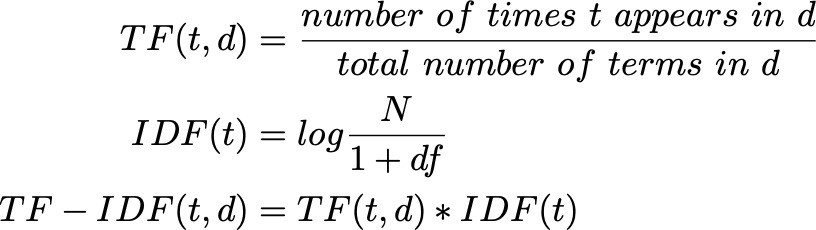

2. [Sentence Neural Embeddings](https://www.sbert.net/) 

### 3.1 TF-IDF

In [18]:
from nltk.stem.snowball import SnowballStemmer 
stemmer = SnowballStemmer("russian") 


# TODO: change additional text cleaning and see what will change
def clean_text(text, stemmer=stemmer):
    '''Text Preprocessing '''
    
    # Convert words to lower case
    text = text.lower()
    
    # Format words and remove unwanted characters
    text = re.sub(r'https?:\/\/.*[\r\n]*', '', text, flags=re.MULTILINE)
    text = re.sub(r'\<a href', ' ', text)
    text = re.sub(r'&amp;', '', text) 
    text = re.sub(r'[_"\-;%()|+&=*%.,!?:#$@\[\]/]', ' ', text)
    text = re.sub(r'<br />', ' ', text)
    text = re.sub(r'\'', ' ', text)
    
    # remove stopwords
    text = text.split()
    stops = stopwords.words("russian")
    text = [stemmer.stem(w) for w in text if not w in stops]
    text = " ".join(text)


    
    return text


In [19]:
train_df['clean_text'] = train_df['processed_text'].apply(lambda x: clean_text(x))
test_df['clean_text'] = test_df['processed_text'].apply(lambda x: clean_text(x))
val_df['clean_text'] = val_df['processed_text'].apply(lambda x: clean_text(x))

In [20]:
# TODO: try different hyperparameters. Link: https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html  
text_transformer = TfidfVectorizer(max_features=200000)
X_train_text = text_transformer.fit_transform(train_df['clean_text'])
X_test_text = text_transformer.transform(test_df['clean_text'])
X_val_text = text_transformer.transform(val_df['clean_text'])

train Roc Auc: 0.9887462797619049
train Accuracy : 0.865909090909091


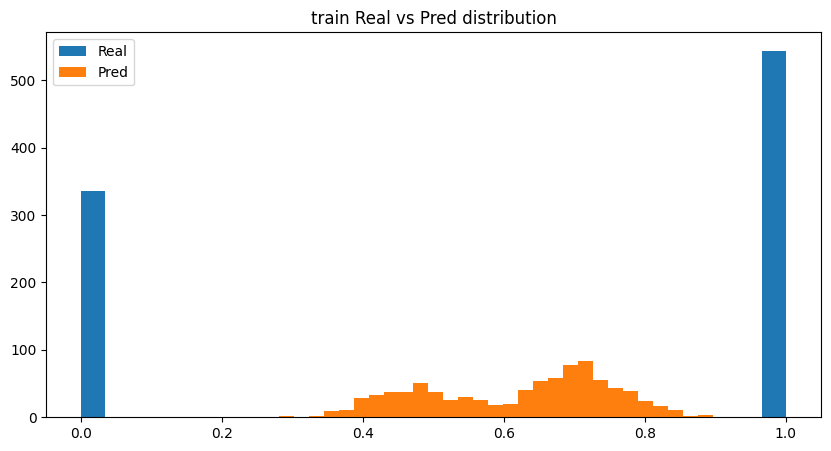

<Figure size 1000x1000 with 0 Axes>

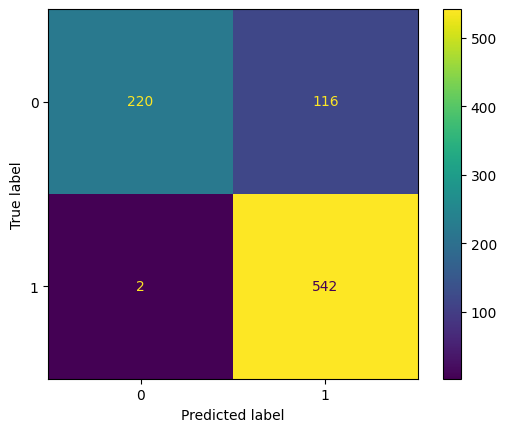

test Roc Auc: 0.7675070952412382
test Accuracy : 0.6088709677419355


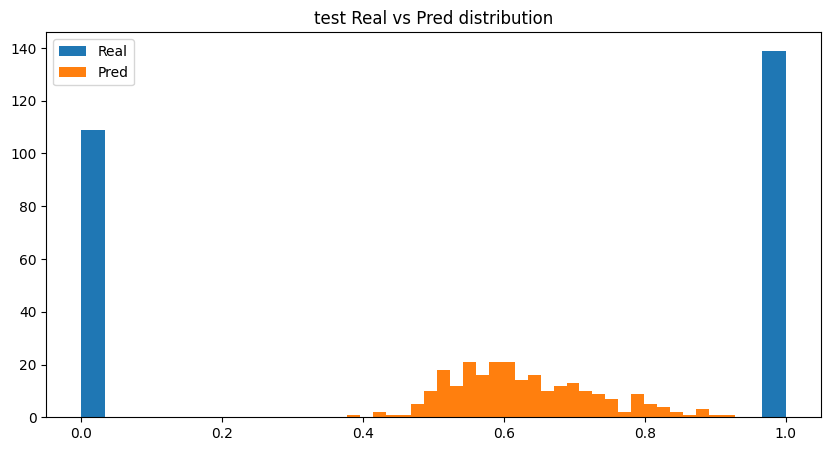

<Figure size 1000x1000 with 0 Axes>

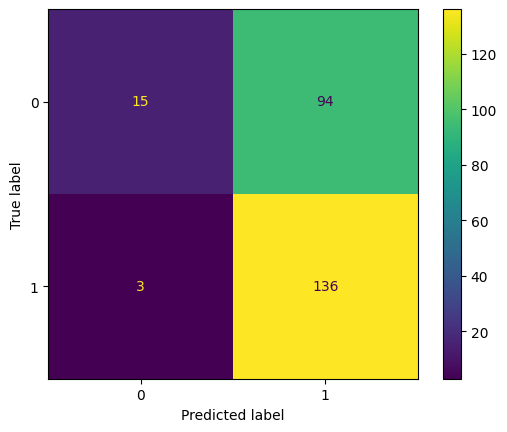

val Roc Auc: 0.7434071729957806
val Accuracy : 0.7244094488188977


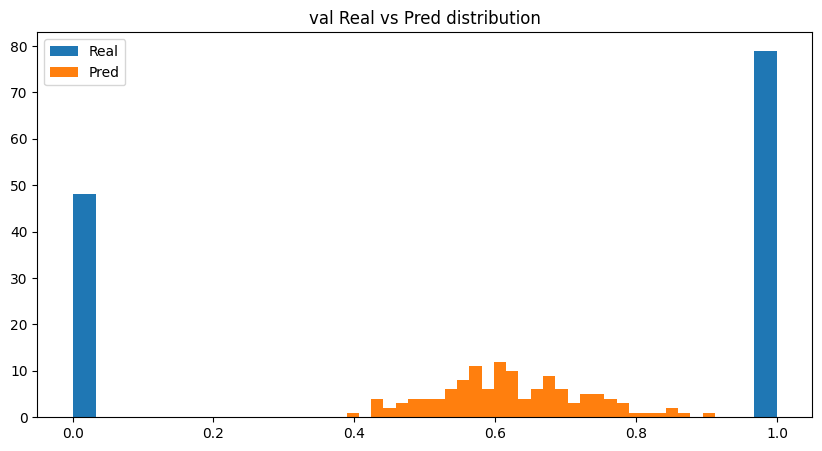

<Figure size 1000x1000 with 0 Axes>

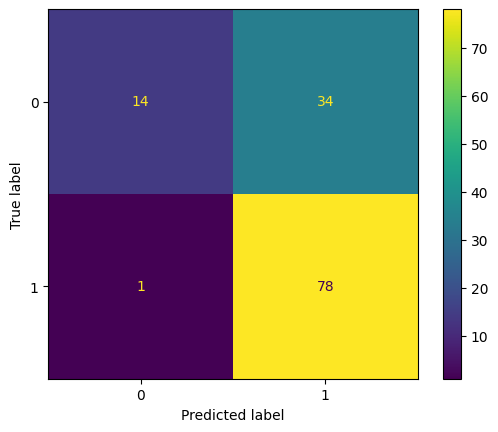

In [21]:
# TODO: try different hyperparameters. Link: https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html
# Try other models:
# RandomForest: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
# SVM: https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html 
log_reg = LogisticRegression().fit(X_train_text, train_df["label"].astype(int).values)
log_reg_train_probs = log_reg.predict_proba(X_train_text)
log_reg_test_probs = log_reg.predict_proba(X_test_text)
log_reg_val_probs = log_reg.predict_proba(X_val_text)
classification_report(
    train_probs=log_reg_train_probs[:,1],
    train_real=train_df["label"].astype(int).values,
    train_texts=train_df["text"].to_list(),
    test_probs=log_reg_test_probs[:,1],
    test_real=test_df["label"].astype(int).values,
    test_texts=test_df["text"].to_list(),
    val_probs=log_reg_val_probs[:,1],
    val_real=val_df["label"].astype(int).values,
    val_texts=val_df["text"].to_list(),
)

### 3.2 Sentence Neural Embeddings

In [22]:
from sentence_transformers import SentenceTransformer

/home/vova/anaconda3/envs/ai_house_env/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [23]:
# TODO: try different models and models: Link https://www.sbert.net/docs/pretrained_models.html 
sbert_model = SentenceTransformer("distiluse-base-multilingual-cased-v1", device="cuda")

train_embs = sbert_model.encode(train_df["processed_text"].to_list())
test_embs = sbert_model.encode(test_df["processed_text"].to_list())
val_embs = sbert_model.encode(val_df["processed_text"].to_list())

train Roc Auc: 0.8746443890056022
train Accuracy : 0.7863636363636364


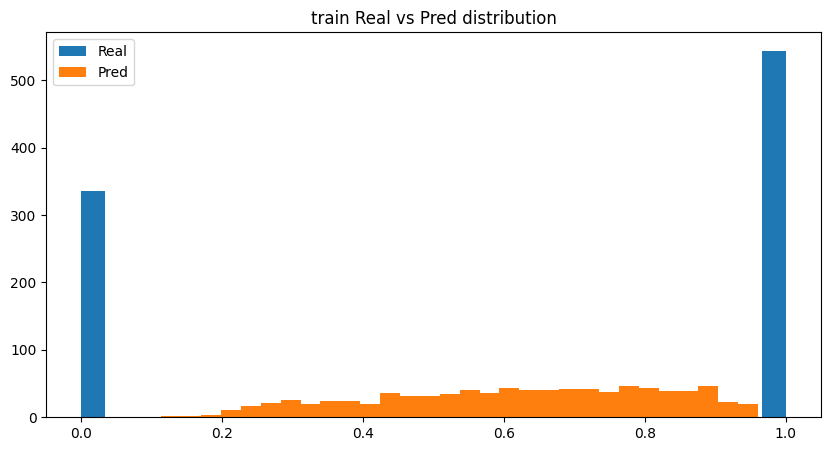

<Figure size 1000x1000 with 0 Axes>

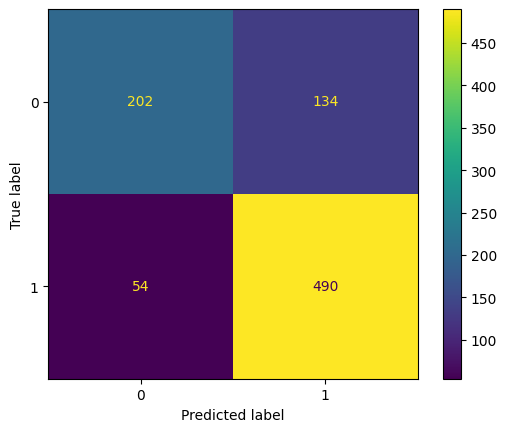

test Roc Auc: 0.8267441092997161
test Accuracy : 0.7419354838709677


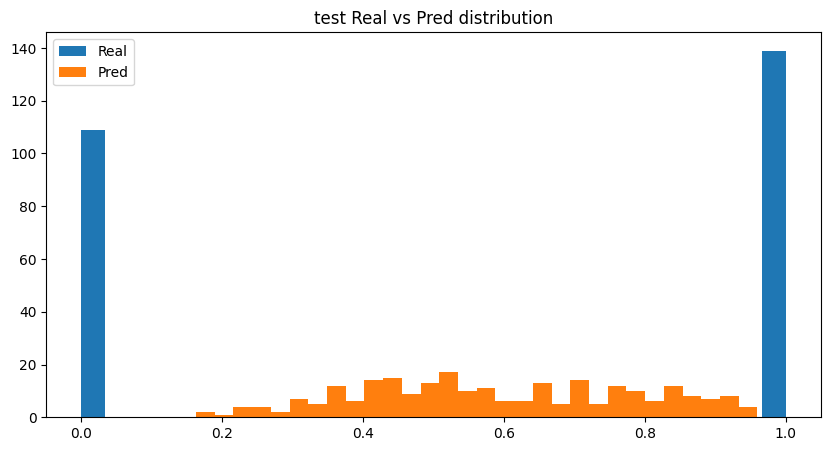

<Figure size 1000x1000 with 0 Axes>

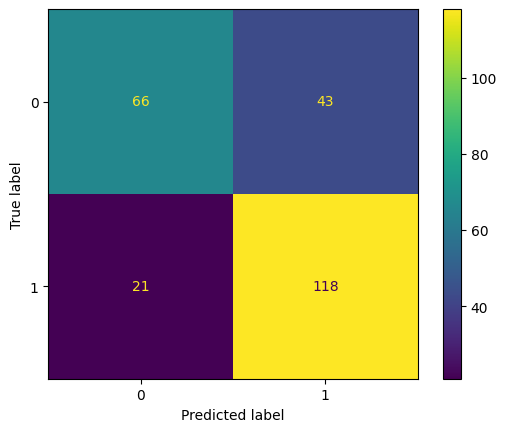

val Roc Auc: 0.7679324894514769
val Accuracy : 0.6929133858267716


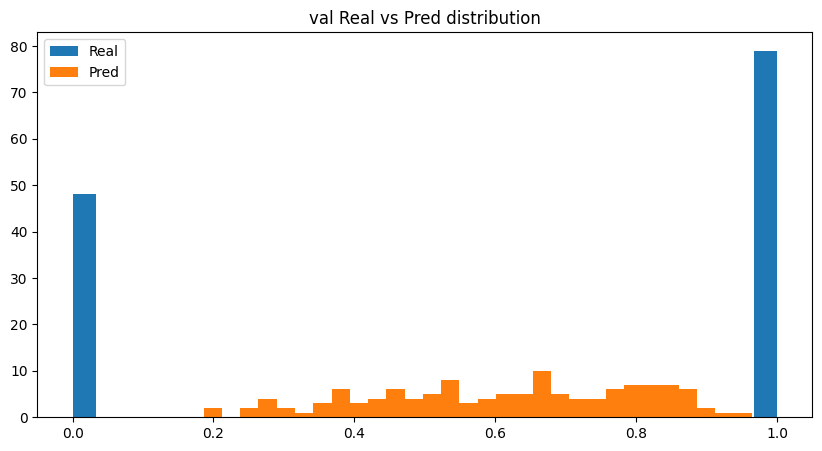

<Figure size 1000x1000 with 0 Axes>

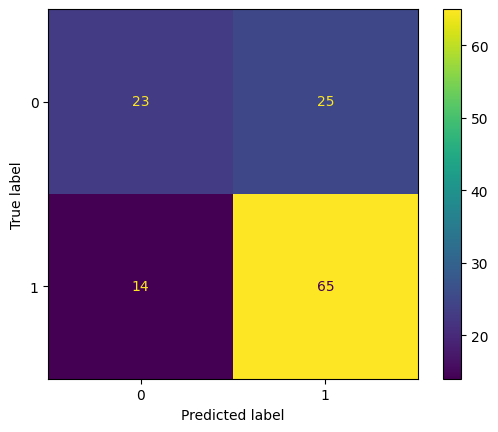

In [24]:
# TODO: try different hyperparameters. Link: https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html
# Try other models:
# RandomForest: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
# SVM: https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html 
log_reg = LogisticRegression().fit(train_embs, train_df["label"].astype(int).values)
log_reg_train_probs = log_reg.predict_proba(train_embs)
log_reg_test_probs = log_reg.predict_proba(test_embs)
log_reg_val_probs = log_reg.predict_proba(val_embs)
classification_report(
    train_probs=log_reg_train_probs[:,1],
    train_real=train_df["label"].astype(int).values,
    train_texts=train_df["text"].to_list(),
    test_probs=log_reg_test_probs[:,1],
    test_real=test_df["label"].astype(int).values,
    test_texts=test_df["text"].to_list(),
    val_probs=log_reg_val_probs[:,1],
    val_real=val_df["label"].astype(int).values,
    val_texts=val_df["text"].to_list(),
)

## 4. Train End2End Transformer model using huggingface

We will mostly follow oficcial huggingface [guide](https://huggingface.co/docs/transformers/tasks/sequence_classification) and adopt it to our case

In [25]:
import gc
import torch
import torch.nn as nn

from scipy.special import expit

del sbert_model
gc.collect()
torch.cuda.empty_cache()


In [26]:
!nvidia-smi

Thu Jan  5 14:42:08 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.129.06   Driver Version: 470.129.06   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  Off  | 00000000:0F:00.0 Off |                    0 |
| N/A   30C    P0    59W / 400W |   2088MiB / 40536MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
|   1  NVIDIA A100-SXM...  Off  | 00000000:15:00.0 Off |                    0 |
| N/A   

In [27]:
from transformers import AutoTokenizer, DataCollatorWithPadding, AutoModelForSequenceClassification, TrainingArguments, Trainer
from datasets import Dataset

In [28]:
class CustomTrainer(Trainer):
    def compute_loss(self, model, inputs, return_outputs=False):
        labels = inputs.get("labels")
        # forward pass
        outputs = model(**inputs)
        logits = outputs.get("logits")
        # compute custom loss 
        # TODO: Try different losses. Link https://pytorch.org/vision/stable/generated/torchvision.ops.sigmoid_focal_loss.html 
        loss_fct = nn.BCEWithLogitsLoss()
        loss = loss_fct(logits, labels.unsqueeze(-1))
        return (loss, outputs) if return_outputs else loss

In [29]:
train_df["label"] = train_df["label"].astype(float)
test_df["label"] = test_df["label"].astype(float)
val_df["label"] = val_df["label"].astype(float)

train_huggingface_ds = Dataset.from_pandas(train_df)
test_huggingface_ds = Dataset.from_pandas(test_df)
val_huggingface_ds = Dataset.from_pandas(val_df)

# TODO: Try different base models. Link https://huggingface.co/models 
tokenizer = AutoTokenizer.from_pretrained("Tatyana/rubert-base-cased-sentiment-new")

def preprocess_function(examples):
    return tokenizer(examples["text"], max_length=512, truncation=True)

tokenized_train_huggingface_ds = train_huggingface_ds.map(preprocess_function, batched=True)
tokenized_test_huggingface_ds = test_huggingface_ds.map(preprocess_function, batched=True)
tokenized_val_huggingface_ds = val_huggingface_ds.map(preprocess_function, batched=True)

data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

bert = AutoModelForSequenceClassification.from_pretrained("Tatyana/rubert-base-cased-sentiment-new", num_labels=1, ignore_mismatched_sizes=True)

# TODO: Try different parameters: Link https://huggingface.co/docs/transformers/v4.24.0/en/main_classes/trainer#transformers.TrainingArguments 
training_args = TrainingArguments(
    output_dir="./results",
    learning_rate=2e-5,
    per_device_train_batch_size=4,
    per_device_eval_batch_size=16,
    num_train_epochs=10,
    weight_decay=0.01,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    fp16=True,
    load_best_model_at_end=True
)

trainer = CustomTrainer(
    model=bert,
    args=training_args,
    train_dataset=tokenized_train_huggingface_ds,
    eval_dataset=tokenized_val_huggingface_ds,
    tokenizer=tokenizer,
    data_collator=data_collator,
)
trainer.train()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 81.52ba/s]
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at Tatyana/rubert-base-cased-sentiment-new and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([3, 768]) in the checkpoint and torch.Size([1, 768]) in the model instantiated
- classifier.bias: found shape torch.Size([3]) in the checkpoint and torch.Size([1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Using amp half precision backend
The following columns in the training set  don't have a corresponding argument in `BertForSequenceClassification.forward` and have been ignored: n_symbols, processed_text, text, n_words, clean_text, id, n_sents. If

Epoch,Training Loss,Validation Loss
1,No log,0.660540
2,No log,0.654681
3,0.629100,0.642422
4,0.629100,0.649829
5,0.587800,0.686827
6,0.587800,0.715457
7,0.547500,0.692458
8,0.547500,0.721927
9,0.547500,0.787356
10,0.518500,0.790880


The following columns in the evaluation set  don't have a corresponding argument in `BertForSequenceClassification.forward` and have been ignored: n_symbols, processed_text, text, n_words, clean_text, id, n_sents. If n_symbols, processed_text, text, n_words, clean_text, id, n_sents are not expected by `BertForSequenceClassification.forward`,  you can safely ignore this message.
***** Running Evaluation *****
  Num examples = 127
  Batch size = 16
Saving model checkpoint to ./results/checkpoint-220
Configuration saved in ./results/checkpoint-220/config.json
Model weights saved in ./results/checkpoint-220/pytorch_model.bin
tokenizer config file saved in ./results/checkpoint-220/tokenizer_config.json
Special tokens file saved in ./results/checkpoint-220/special_tokens_map.json
The following columns in the evaluation set  don't have a corresponding argument in `BertForSequenceClassification.forward` and have been ignored: n_symbols, processed_text, text, n_words, clean_text, id, n_sents. I

TrainOutput(global_step=2200, training_loss=0.5665867337313565, metrics={'train_runtime': 174.1606, 'train_samples_per_second': 50.528, 'train_steps_per_second': 12.632, 'total_flos': 563202657179352.0, 'train_loss': 0.5665867337313565, 'epoch': 10.0})

In [30]:
bert_train_pred = trainer.predict(test_dataset=tokenized_train_huggingface_ds)
bert_test_pred = trainer.predict(test_dataset=tokenized_test_huggingface_ds)
bert_val_pred = trainer.predict(test_dataset=tokenized_val_huggingface_ds)

The following columns in the test set  don't have a corresponding argument in `BertForSequenceClassification.forward` and have been ignored: n_symbols, processed_text, text, n_words, clean_text, id, n_sents. If n_symbols, processed_text, text, n_words, clean_text, id, n_sents are not expected by `BertForSequenceClassification.forward`,  you can safely ignore this message.
***** Running Prediction *****
  Num examples = 880
  Batch size = 16


The following columns in the test set  don't have a corresponding argument in `BertForSequenceClassification.forward` and have been ignored: n_symbols, processed_text, text, n_words, clean_text, id, n_sents. If n_symbols, processed_text, text, n_words, clean_text, id, n_sents are not expected by `BertForSequenceClassification.forward`,  you can safely ignore this message.
***** Running Prediction *****
  Num examples = 248
  Batch size = 16
The following columns in the test set  don't have a corresponding argument in `BertForSequenceClassification.forward` and have been ignored: n_symbols, processed_text, text, n_words, clean_text, id, n_sents. If n_symbols, processed_text, text, n_words, clean_text, id, n_sents are not expected by `BertForSequenceClassification.forward`,  you can safely ignore this message.
***** Running Prediction *****
  Num examples = 127
  Batch size = 16


train Roc Auc: 0.7721791841736694
train Accuracy : 0.7522727272727273


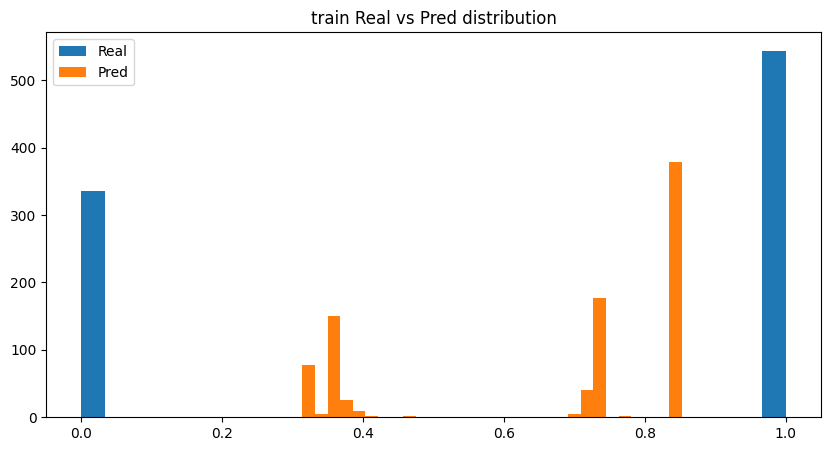

<Figure size 1000x1000 with 0 Axes>

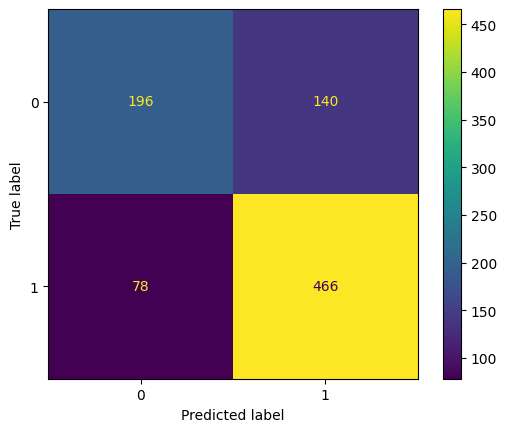

test Roc Auc: 0.7038809319516863
test Accuracy : 0.6491935483870968


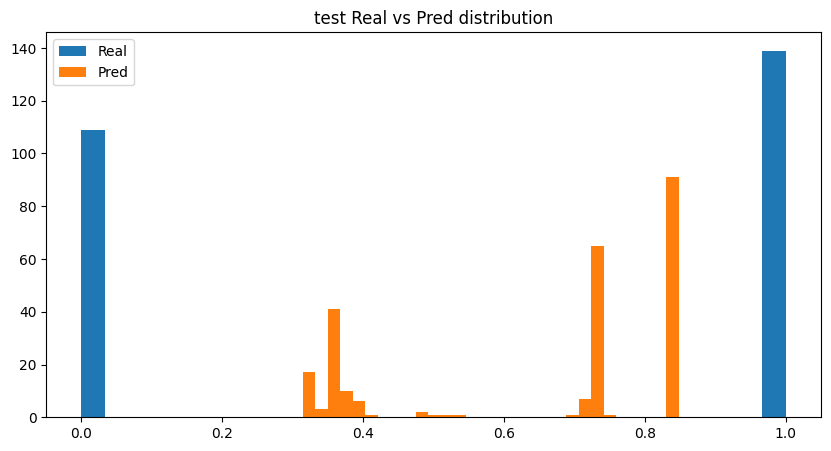

<Figure size 1000x1000 with 0 Axes>

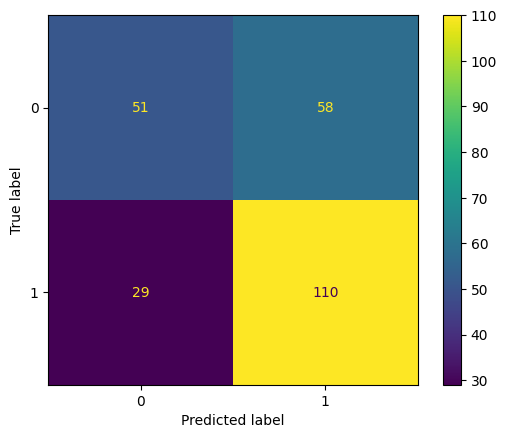

val Roc Auc: 0.658623417721519
val Accuracy : 0.6535433070866141


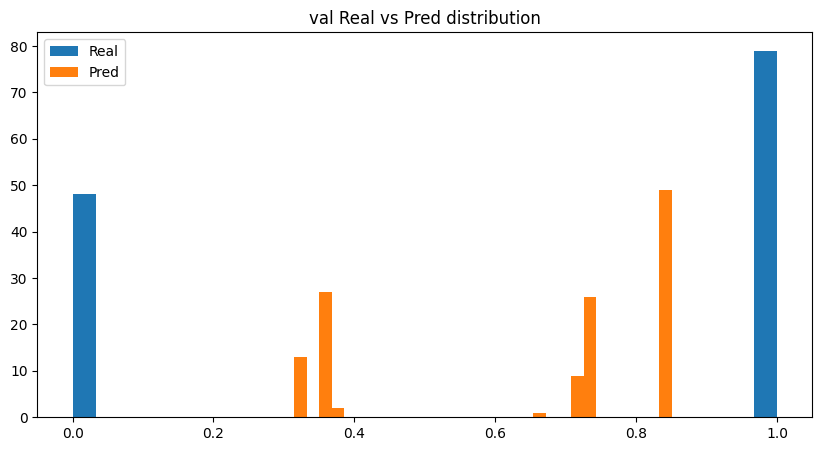

<Figure size 1000x1000 with 0 Axes>

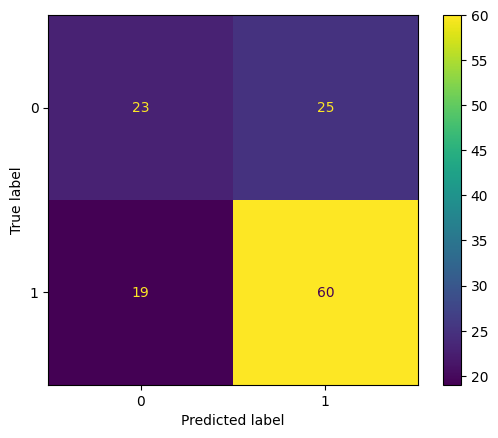

In [31]:
classification_report(
    train_probs=expit(bert_train_pred.predictions[:,0]),
    train_real=train_df["label"].astype(int).values,
    train_texts=train_df["text"].to_list(),
    test_probs=expit(bert_test_pred.predictions[:,0]),
    test_real=test_df["label"].astype(int).values,
    test_texts=test_df["text"].to_list(),
    val_probs=expit(bert_val_pred.predictions[:,0]),
    val_real=val_df["label"].astype(int).values,
    val_texts=val_df["text"].to_list(),
)

## 5. Aplly topic modelling approaches 

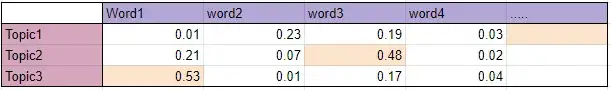

In [32]:
import gensim.corpora as corpora
import gensim
# Create Dictionary
vocab = corpora.Dictionary([d.split() for d in list(train_df['clean_text'])])
# Create Corpus
texts = list(train_df['clean_text'])

corpus = [vocab.doc2bow(text.split()) for text in texts]
# View
print(corpus[:1][0][:30])


[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1)]


In [33]:
from pprint import pprint
# number of topics
num_topics = 10
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=vocab,
                                       num_topics=num_topics)
# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.009*"росс" + 0.008*"украин" + 0.007*"всу" + 0.006*"воен" + 0.005*"наш" + '
  '0.005*"рф" + 0.005*"аэс" + 0.005*"украинск" + 0.004*"сил" + 0.004*"днр"'),
 (1,
  '0.012*"российск" + 0.011*"украин" + 0.007*"эт" + 0.007*"украинск" + '
  '0.006*"котор" + 0.005*"росс" + 0.005*"город" + 0.004*"войн" + 0.004*"бо" + '
  '0.004*"наш"'),
 (2,
  '0.018*"украин" + 0.011*"рф" + 0.007*"воен" + 0.006*"киев" + 0.006*"росс" + '
  '0.006*"русск" + 0.006*"эт" + 0.005*"котор" + 0.005*"сво" + 0.004*"заяв"'),
 (3,
  '0.009*"росс" + 0.009*"украин" + 0.008*"украинск" + 0.007*"российск" + '
  '0.006*"наш" + 0.005*"заяв" + 0.005*"всу" + 0.004*"котор" + 0.004*"глав" + '
  '0.004*"эт"'),
 (4,
  '0.012*"украинск" + 0.011*"росс" + 0.007*"украин" + 0.006*"русск" + '
  '0.006*"киев" + 0.006*"воен" + 0.005*"район" + 0.004*"российск" + 0.004*"рф" '
  '+ 0.004*"войн"'),
 (5,
  '0.010*"украин" + 0.008*"украинск" + 0.008*"всу" + 0.007*"росс" + 0.006*"рф" '
  '+ 0.005*"российск" + 0.004*"воен" + 0.004*"русск" + 0.

In [34]:
import pickle 
import os
import pyLDAvis
import pyLDAvis.gensim_models
# Visualize the topics
pyLDAvis.enable_notebook()

LDAvis_prepared = pyLDAvis.gensim_models.prepare(lda_model, corpus, vocab)
LDAvis_prepared

/home/vova/anaconda3/envs/ai_house_env/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/home/vova/anaconda3/envs/ai_house_env/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
/home/vova/anaconda3/envs/ai_house_env/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.040946  0.017375       1        1  14.991736
6     -0.018771  0.007377       2        1  14.013683
2      0.018092 -0.035742       3        1  12.520961
3     -0.049408 -0.007882       4        1  11.708150
0      0.047254 -0.060211       5        1   8.931984
1     -0.047265 -0.030655       6        1   8.914401
5      0.042856 -0.009731       7        1   8.112265
4      0.027276  0.077463       8        1   8.026126
8     -0.039369  0.017307       9        1   6.436664
9      0.060282  0.024698      10        1   6.344030, topic_info=         Term        Freq       Total Category  logprob  loglift
10         рф  109.000000  109.000000  Default  30.0000  30.0000
51   украинск  132.000000  132.000000  Default  29.0000  29.0000
250       всу   88.000000   88.000000  Default  28.0000  28.0000
158  российск  134.000000  134.000000  Default  27.0000  27.0000
129       аэс   16.000000   16.000000  Default  26.0000  26.0000
..        ...         ...         ...      ...      ...      ...
395       наш    4.694837  101.696697  Topic10  -5.6944  -0.3179
175      виде    3.736338   50.970313  Topic10  -5.9227   0.1445
389     жител    3.330487   36.822743  Topic10  -6.0377   0.3547
51   украинск    4.160573  132.229993  Topic10  -5.8152  -0.7012
228        эт    4.153715  142.410344  Topic10  -5.8168  -0.7771

[807 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
2064      1  0.137670          11
2064      5  0.413009          11
2064      7  0.137670          11
2064      8  0.137670          11
2112      1  0.735920        1135
...     ...       ...         ...
228       8  0.035110          эт
228       9  0.028088          эт
228      10  0.028088          эт
1937     10  0.486417      яндекс
4471      8  0.692544  ясиноватск

[1878 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 7, 3, 4, 1, 2, 6, 5, 9, 10])

In [35]:
from bertopic import BERTopic
# TODO: Try different models and hyperparameters. Link https://github.com/MaartenGr/BERTopic 
topic_model = BERTopic(language="multilingual")
topics, probs = topic_model.fit_transform(train_df['text'])

loading configuration file /home/vova/.cache/torch/sentence_transformers/sentence-transformers_paraphrase-multilingual-MiniLM-L12-v2/config.json
Model config BertConfig {
  "_name_or_path": "/home/vova/.cache/torch/sentence_transformers/sentence-transformers_paraphrase-multilingual-MiniLM-L12-v2/",
  "architectures": [
    "BertModel"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 384,
  "initializer_range": 0.02,
  "intermediate_size": 1536,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.17.0",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 250037
}

loading weights file /home/vova/.cache/torch/sentence_transformers/sentence-transformers_paraphrase-multilingu

In [36]:
topic_model.get_topic_info()

,Topic,Count,Name
0,-1,450,-1_не_на_что_из
1,0,178,0_на_рф_всу_минобороны
2,1,50,1_https_мы_com_не
3,2,30,2_переговоры_переговоров_зеленский_президента
4,3,26,3_ес_санкции_против_россии
5,4,21,4_киев_киеве_бои_киева
6,5,20,5_ракеты_ракета_по_удар
7,6,19,6_взрывы_донецке_слышны_взрыв
8,7,19,7_swift_россии_карт_цб
9,8,18,8_русских_что_геноцид_на


In [37]:
topic_model.get_topic(0)

[('на', 0.0346809920560841),
 ('рф', 0.033040695394133505),
 ('всу', 0.029400722237830298),
 ('минобороны', 0.026242209970505956),
 ('под', 0.025959188609746015),
 ('днр', 0.0233387584769121),
 ('по', 0.022137985796728273),
 ('области', 0.021898113296364197),
 ('россии', 0.021603904400897843),
 ('российские', 0.020584804360185924)]

/home/vova/anaconda3/envs/ai_house_env/lib/python3.9/site-packages/plotly/io/_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.

/home/vova/anaconda3/envs/ai_house_env/lib/python3.9/site-packages/plotly/io/_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



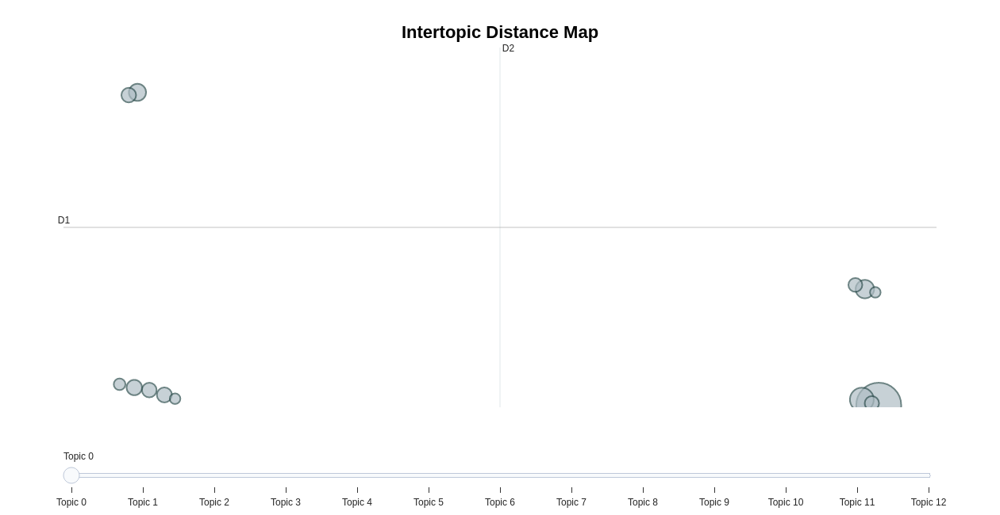

In [38]:
topic_model.visualize_topics()